### Workflow stages

#### 1. Define problems for this competition and import the dataset
#### 2. Analyse the data
- Understand nature of the data .info() .describe()
- Histograms and boxplots 
- Value counts 
- Missing data 
- Correlation between the metrics 
- Explore interesting themes 
    - Timestamps
    - axis: X Y Z
- Feature engineering 
- preprocess data together or use a transformer? 
    - use label for train and test   
- Scaling?
#### 4. Divide the dataset. (train data and test data)
#### 5. Build a classifier using the algorithm of you choice and fit it with the train data
#### 6. Evaluate the model with the test data


In [1]:
# Import libraries

# pandas
import pandas as pd
from pandas import Series,DataFrame

# numpy, matplotlib, seaborn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier


In [2]:
# Import data from 
df_signals = pd.read_csv("bearing_signals.csv", low_memory=False)

In [3]:
df_classes = pd.read_csv("bearing_classes.csv",sep=";")

In [4]:
df_signals.shape
df_signals.info()
pd.set_option('display.max_columns',111)
df_signals.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10265700 entries, 0 to 10265699
Data columns (total 13 columns):
 #   Column         Dtype  
---  ------         -----  
 0   experiment_id  int64  
 1   bearing_1_id   int64  
 2   bearing_2_id   int64  
 3   timestamp      float64
 4   a1_x           float64
 5   a1_y           float64
 6   a1_z           float64
 7   a2_x           float64
 8   a2_y           float64
 9   a2_z           float64
 10  rpm            float64
 11  hz             float64
 12  w              float64
dtypes: float64(10), int64(3)
memory usage: 1018.2 MB


,experiment_id,bearing_1_id,bearing_2_id,timestamp,a1_x,a1_y,a1_z,a2_x,a2_y,a2_z,rpm,hz,w
count,1.026570e+07,10265700.0,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07,1.026570e+07
mean,5.658897e+01,0.0,5.658897e+01,1.556797e+01,-2.200731e-01,-4.832596e-02,-5.254890e-02,-3.124191e-01,-8.758339e-02,7.102206e-02,-2.760059e+05,-4.600098e+03,4.629741e-01
std,3.231361e+01,0.0,3.231361e+01,9.425589e+00,1.824082e+00,1.450662e+00,1.768919e+00,2.553113e+00,2.631378e+00,2.700098e+00,4.076958e+07,6.794930e+05,4.565080e-01
min,1.000000e+00,0.0,1.000000e+00,0.000000e+00,-1.604771e+01,-1.887183e+01,-1.633967e+01,-1.765083e+01,-1.873959e+01,-2.296248e+01,-6.000000e+09,-1.000000e+08,1.407501e-06
25%,2.900000e+01,0.0,2.900000e+01,7.638000e+00,-1.041087e+00,-6.073697e-01,-8.785304e-01,-1.602094e+00,-1.247228e+00,-1.040389e+00,4.774536e+02,7.957560e+00,4.778236e-02
50%,5.600000e+01,0.0,5.600000e+01,1.527633e+01,-1.753203e-01,-3.956274e-02,-1.424326e-02,-3.748382e-01,2.226305e-03,5.571547e-02,1.285714e+03,2.142857e+01,3.781180e-01
75%,8.500000e+01,0.0,8.500000e+01,2.291433e+01,5.942500e-01,5.282442e-01,8.500439e-01,8.524177e-01,8.672333e-01,1.151820e+00,1.487603e+03,2.479339e+01,7.271071e-01
max,1.120000e+02,0.0,1.120000e+02,5.549967e+01,1.560087e+01,1.614294e+01,1.640721e+01,1.916685e+01,2.249241e+01,2.596364e+01,9.000135e+04,1.500023e+03,9.393605e+00


In [5]:
print(df_signals.columns)
print(df_classes.columns)

Index(['experiment_id', 'bearing_1_id', 'bearing_2_id', 'timestamp', 'a1_x',
       'a1_y', 'a1_z', 'a2_x', 'a2_y', 'a2_z', 'rpm', 'hz', 'w'],
      dtype='object')
Index(['bearing_id', 'status'], dtype='object')


In [6]:
df_signals.experiment_id.unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112])

In [7]:
print(df_signals.timestamp.unique())
print(df_signals.timestamp.nunique())

[0.00000000e+00 3.33333333e-04 6.66666667e-04 ... 5.54990000e+01
 5.54993333e+01 5.54996667e+01]
166500


In [8]:
#Check for the null values
df_signals.isnull().sum()

experiment_id    0
bearing_1_id     0
bearing_2_id     0
timestamp        0
a1_x             0
a1_y             0
a1_z             0
a2_x             0
a2_y             0
a2_z             0
rpm              0
hz               0
w                0
dtype: int64

In [9]:
#Check for the 0 values in cols
for col in df_signals.select_dtypes('float64'):
    print(f"{col} has {(df_signals[col]== 0).sum()} zero values")

timestamp has 112 zero values
a1_x has 0 zero values
a1_y has 0 zero values
a1_z has 0 zero values
a2_x has 0 zero values
a2_y has 0 zero values
a2_z has 0 zero values
rpm has 366785 zero values
hz has 366785 zero values
w has 0 zero values


In [11]:
df = df_signals[df_signals['timestamp'] != 0]
df.shape

(10265588, 13)

In [12]:
df = df.sort_values(by = ['experiment_id', 'timestamp'], ignore_index=True)
df.tail()

,experiment_id,bearing_1_id,bearing_2_id,timestamp,a1_x,a1_y,a1_z,a2_x,a2_y,a2_z,rpm,hz,w
10265583,112,0,112,32.098333,-0.367713,0.149706,0.465916,-0.469243,0.194450,0.553945,178.748759,2.979146,0.019412
10265584,112,0,112,32.098667,-0.463909,0.338975,0.561948,-0.469243,0.194450,0.354653,178.748759,2.979146,0.032027
10265585,112,0,112,32.099000,0.017072,0.433610,0.369884,-0.563647,-0.093886,0.155361,178.748759,2.979146,0.012211
10265586,112,0,112,32.099333,0.209465,0.244341,0.273852,-0.374838,0.194450,0.155361,178.748759,2.979146,0.000764
10265587,112,0,112,32.099667,0.498054,0.244341,0.177821,-0.186030,0.290562,-0.243222,178.748759,2.979146,0.002794


In [13]:
# Drop columns: redundant
df.drop(columns=['bearing_1_id','bearing_2_id','rpm'],inplace=True)
print(df.shape)
df.head()

(10265588, 10)


,experiment_id,timestamp,a1_x,a1_y,a1_z,a2_x,a2_y,a2_z,hz,w
0,1,0.000333,-0.367713,-0.228832,0.177821,0.285992,0.002226,-0.043930,0.0,0.000243
1,1,0.000667,0.113269,0.149706,-0.398371,-0.091625,0.002226,0.454299,0.0,0.000369
2,1,0.001000,-0.175320,-0.228832,-0.110275,0.285992,0.002226,0.255007,0.0,0.000520
3,1,0.001333,-0.079124,0.055072,-0.110275,0.191588,0.002226,0.255007,0.0,0.000175
4,1,0.001667,-0.175320,-0.039563,-0.110275,0.191588,0.194450,0.255007,0.0,0.000520


array([[<AxesSubplot:title={'center':'timestamp'}>]], dtype=object)

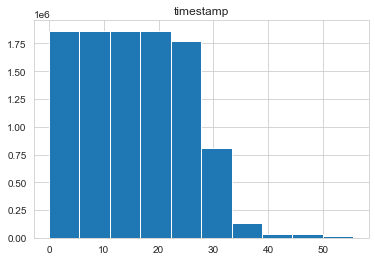

In [14]:
df.hist('timestamp')#counted by second

array([[<AxesSubplot:title={'center':'status'}>]], dtype=object)

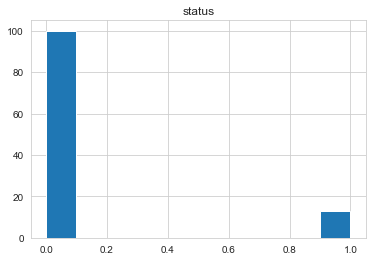

In [15]:
df_classes.hist('status')

#### Features:
**Vibration** 
- {rotation speed1-rpm/revolutions per minutes; 
- hz: rotation speed2 in Hertz; 
- w: power of the motor at a time, measured in Watts}
**Acceleration** timestamp, 3d axis (X,Y,Z) movement
- timestamp
- a1_x, a2_x
- a1_y, a2_y
- a1_z, a2_z

**Target** Defection {good: 1, failure:0}

In [16]:
#Take randomly one experiment to 
id_experiment = 110
df_experiment110 = df_signals[df_signals['experiment_id']==id_experiment]

In [17]:
print(df_experiment110.shape[0])
print(df_signals.shape[0])
print(df_classes.shape[0])

87900
10265700
113


In [18]:
len(df_signals['experiment_id'].unique())

112

## Some visualisation of experiments


In [20]:
# It is possible to apply this function for generating experiment from df
def generate_dataset(dataframe, exp_nr):
    if exp_nr <= (len(dataframe.experiment_id.unique())):
        return pd.DataFrame(dataframe[dataframe.experiment_id == exp_nr])

df12 = generate_dataset(df, 12)        
print(df12.shape)

(87299, 10)


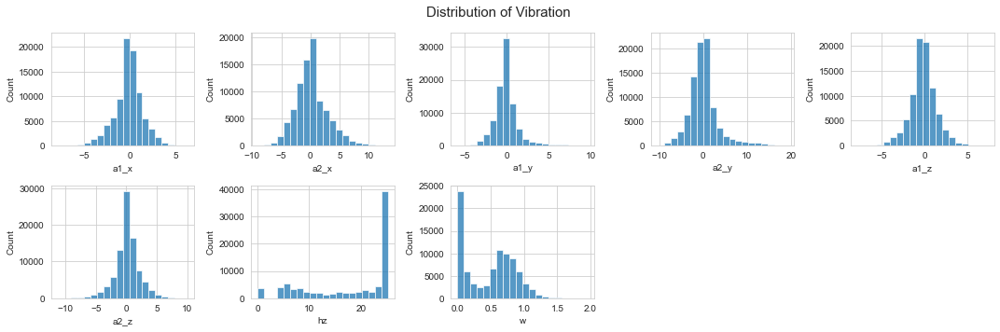

In [21]:
# Plot to see distribution of each features

num_feature = ["a1_x","a2_x", "a1_y", "a2_y", "a1_z", "a2_z", "hz", "w"]
enum_feature = list(enumerate(num_feature))

plt.figure(figsize=(15,5))
plt.suptitle("Distribution of Vibration ", fontsize=15)
    
# Histogram    
for i in enum_feature:
    plt.subplot(2,5,i[0]+1)
    sns.histplot(data = df12[i[1]], palette="rainbow", bins=20)
    plt.xlabel(str(i[1]))

plt.tight_layout()
plt.show()

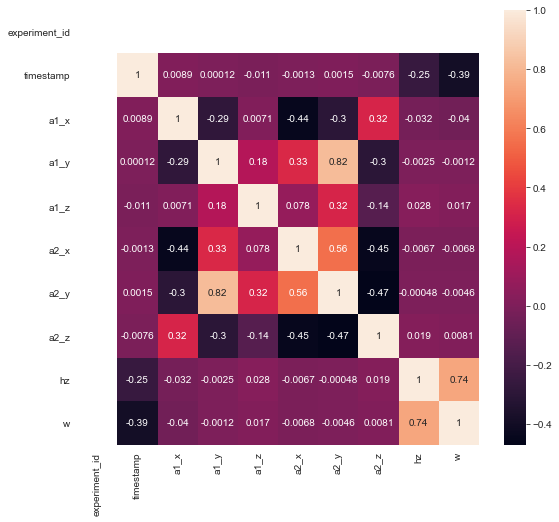

In [41]:
import seaborn as sns
plt.figure(figsize=(9,8))
  
# generating correlation heatmap
sns.heatmap(df12.corr(), annot = True)
  
# posting correlation heatmap to output console 
plt.show()

In [23]:
df.describe()

,experiment_id,timestamp,a1_x,a1_y,a1_z,a2_x,a2_y,a2_z,hz,w
count,1.026559e+07,1.026559e+07,1.026559e+07,1.026559e+07,1.026559e+07,1.026559e+07,1.026559e+07,1.026559e+07,1.026559e+07,1.026559e+07
mean,5.658897e+01,1.556814e+01,-2.200746e-01,-4.832675e-02,-5.254835e-02,-3.124203e-01,-8.758572e-02,7.102210e-02,-4.590407e+03,4.629788e-01
std,3.231360e+01,9.425500e+00,1.824092e+00,1.450670e+00,1.768928e+00,2.553126e+00,2.631391e+00,2.700112e+00,6.787795e+05,4.565080e-01
min,1.000000e+00,3.333333e-04,-1.604771e+01,-1.887183e+01,-1.633967e+01,-1.765083e+01,-1.873959e+01,-2.296248e+01,-1.000000e+08,1.407501e-06
25%,2.900000e+01,7.638333e+00,-1.041087e+00,-6.073697e-01,-8.785304e-01,-1.602094e+00,-1.247228e+00,-1.040389e+00,7.957560e+00,4.778236e-02
50%,5.600000e+01,1.527633e+01,-1.753203e-01,-3.956274e-02,-1.424326e-02,-3.748382e-01,2.226305e-03,5.571547e-02,2.142857e+01,3.781180e-01
75%,8.500000e+01,2.291433e+01,5.942500e-01,5.282442e-01,8.500439e-01,8.524177e-01,8.672333e-01,1.151820e+00,2.479339e+01,7.271071e-01
max,1.120000e+02,5.549967e+01,1.560087e+01,1.614294e+01,1.640721e+01,1.916685e+01,2.249241e+01,2.596364e+01,1.500023e+03,9.393605e+00


In [27]:
#print(df_signals.describe())
signal_over200 = df[df.hz > 200]
print(len(signal_over200))
signal_over200.experiment_id.unique()
#we detected 12 experiment has  (hz > 200)

3629


array([ 8, 11, 14, 17, 19, 23, 24, 29, 36, 81])

In [ ]:
experiment_outliers = [ 8, 11, 14, 17, 19, 23, 24, 29, 36, 81]

In [28]:
#Let take one of experiment containing the outlier
df11 = generate_dataset(df, 11)        
fig = px.line(df11, x="timestamp", y=["hz"], title='The speed motor ')
plt.tight_layout()
fig.show()
# We found in the line below the hight frequency(Hz) appear in a short time (less than 1 second)

<Figure size 432x288 with 0 Axes>

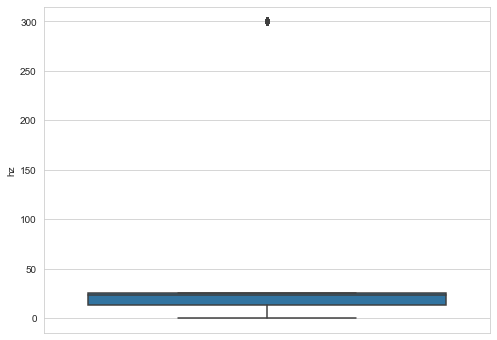

In [29]:
#Using boxplot and detect outliers of 
plt.figure(figsize=(8,6))
sns.boxplot(y=df11["hz"])
plt.show()

In [31]:
print(f'max: {df11.hz.max()}, min: {df11.hz.min()}, mean: {df11.hz.mean()}')


max: 300.0009000027003, min: 0.0, mean: 20.166520197553808


In [37]:
# get steady speed Hertz
steady_filter = (df12['hz'] > 24) & (df12['hz'] < 25.5)
experiment_steady_speed = df12[steady_filter]

In [38]:
import plotly.express as px # library for plotting

fig = px.line(experiment_steady_speed, x="timestamp", y=["hz"], title='The speed motor ')
plt.tight_layout()
fig.show()

<Figure size 432x288 with 0 Axes>

#### Create the functions to represent for new features of data

In [42]:
# Standard deviation is a statistical metric defining the amount of variation in the signal
def get_std(signal):
    return signal.std()   #1 feature

# Mean, max, min
def get_median(signal):
    return signal.median()

def get_max(signal):
    return signal.max()

def get_min(signal):
    return signal.min()


In [43]:
#Entropy is a calculation of the uncertainty and randomness of a sampled vibration data.
from math import log, e

def get_entropy(signal, base=None):   
    vc = signal.value_counts(normalize=True, sort=False)
    base = e if base is None else base
    return -(vc * np.log(vc)/np.log(base)).sum()

# Impulse Factor is used to measure how much impact is generated from the bearing defect. 
#IF divides the maximum absolute value by the mean of absolute value.
def get_impulse_factor(signal):    #f3
    return signal.abs().max() / (signal.abs().sum() / len(signal))

# Margin factor (MF) measures the level of impact between rolling element and raceway. 
#The MF is calculated by dividing the maximum absolute value of vibration signal to 
#the RMS of absolute value of vibration signal

def get_margin_factor(signal):  #f4
    signal = signal.to_numpy()
    return np.max(np.abs(signal)) / ((np.sum(np.sqrt(np.abs(signal)))/ len(signal))**2)

In [44]:
def get_frequency_centre(signal):   #f5
    return ((signal.diff()*signal).sum()) / (2 * np.pi * np.sum(signal**2))

def get_mean_square_frequency(signal): #f6
    return  np.sum(signal.diff()**2) / (4 * np.pi**2 * np.sum(signal**2))

def get_root_mean_square_frequency(signal): #f7
    return  np.sqrt(get_mean_square_frequency(signal))

def get_root_variance_frequency(signal):   #8
    return  np.sqrt(get_mean_square_frequency(signal) - get_frequency_centre(signal)**2)

### ***Peak acceleration*** may be easy, but it is often very misleading. 
There is some correlation between the significance of the fault and the peak acceleration, it isn't a perfect correlation. Peak acceleration values can be too dependent on a bit of chance with how the sampling lines up with the data. When you are comparing multiple signals to each other, any difference in sample rate or low-pass filters will make the comparison between the peak accelerations inappropriate and even more misleading than normal.

In [45]:
def get_peak_acceleration(signal): #
    return pd.DataFrame.max(signal.abs())

**Root mean square (RMS)** is by far my preference over peak because it is independent of the sample rate and it will more accurately let you compare the vibration levels of two signals. The RMS value increase gradually as fault developed. However, RMS is unable to provide the information of incipient fault stage while it increases with the fault development.

https://www.bksv.com/media/doc/BO0210.pdf

**Crest factor** Get an earlier warning of bearing failure by using the same type vibration of equipment used for measuring overall vibration, by using the same type of equipment used for measuring overall vibration, to regularly measure the crest factor of the bearing vibration . The crest factor is the Peak-to-RMS ratio of the vibration.

In [46]:
def get_rms_acceleration(signal): #omit
    N = len(signal)
    return np.sqrt(1/N * (signal**2).sum())

In [47]:
def get_crest_factor(signal):  #f9
    return get_peak_acceleration(signal)/get_rms_acceleration(signal)


In [48]:
list_features_function = [
                        get_std,
                        get_median,
                        get_max,
                        get_min,
                        get_entropy, 
                        get_impulse_factor, 
                        get_margin_factor,
                        get_frequency_centre, 
                        get_mean_square_frequency, 
                        get_root_mean_square_frequency,
                        get_root_variance_frequency,
                        get_crest_factor
                            ]

In [51]:
# RUN each of experiment_id with the collection of functions, select columns: a1_x, a1_y, a2_y
experiment_ls = df_signals['experiment_id'].unique()
data_stationary_features = []
for exp in experiment_ls:
    df_experiment = df_signals[(df_signals['experiment_id']==exp)]
    steady_filter = (df_experiment['hz'] > 24) & (df_experiment['hz'] < 25.5)
    experiment_steady = df_experiment[steady_filter]

    feature_hert = []    
    feature_watt = []
    feature_a1_x = []
    feature_a2_x = []
    feature_a1_y = []
    feature_a2_y = []
    feature_a1_z = []
    feature_a2_z = []
    for func in list_features_function:
        hert = func(experiment_steady['hz'])
        watt = func(experiment_steady['w']) 
        a1x = func(experiment_steady['a1_x'])
        a2x = func(experiment_steady['a2_x'])
        a1y = func(experiment_steady['a1_y'])
        a2y = func(experiment_steady['a2_y'])
        a1z = func(experiment_steady['a1_z'])
        a2z = func(experiment_steady['a2_z'])
        if (type(hert) == list) & (type(watt) == list):
            feature_hert+=hert
            feature_watt+=watt
            feature_a1_x+=a1x
            feature_a2_x+=a2x
            feature_a1_y+=a1y
            feature_a2_y+=a2y
            feature_a1_z+=a1z
            feature_a2_z+=a2z            
        else:
            feature_hert.append(hert)
            feature_watt.append(watt)
            feature_a1_x.append(a1x)
            feature_a2_x.append(a2x)
            feature_a1_y.append(a1y)
            feature_a2_y.append(a2y)            
            feature_a1_z.append(a1z)
            feature_a2_z.append(a2z)            
            
    data_stationary_features.append((feature_hert,
                                    feature_watt,
                                    feature_a1_x,
                                    feature_a2_x,
                                    feature_a1_y,
                                    feature_a2_y,
                                    feature_a1_z,
                                    feature_a2_z))

In [52]:
len(data_stationary_features) 

112

In [53]:
data_stationary_features = np.array(data_stationary_features,ndmin=3)
df_feature_hert = pd.DataFrame(data_stationary_features[:,0,:]) 
df_feature_watt = pd.DataFrame(data_stationary_features[:,1,:])
df_feature_a1x = pd.DataFrame(data_stationary_features[:,2,:])
df_feature_a2x = pd.DataFrame(data_stationary_features[:,3,:])
df_feature_a1y = pd.DataFrame(data_stationary_features[:,4,:])
df_feature_a2y = pd.DataFrame(data_stationary_features[:,5,:])
df_feature_a1z = pd.DataFrame(data_stationary_features[:,6,:])
df_feature_a2z = pd.DataFrame(data_stationary_features[:,7,:])

In [54]:
#Append column names
df_feature_hert.columns =['hert_std', 'hert_median', 'hert_max', 'hert_min', 'hert_entropy','hert_impulse','hert_margin','hert_frequence', 'hert_MS_F','hert_RMQ_F','hert_RV_F','hert_crest_F']
df_feature_watt.columns =['w_std', 'w_median', 'w_max', 'w_min', 'w_entropy','w_impulse','w_margin','w_frequence', 'w_MS_F','w_RMQ_F','w_RV_F','w_crest_F']
df_feature_a1x.columns =['a1_x_std', 'a1_x_median', 'a1_x_max', 'a1_x_min', 'a1_x_entropy','a1_x_impulse','a1_x_margin','a1_x_frequence', 'a1_x_MS_F','a1_x_RMQ_F','a1_x_RV_F','a1_x_crest_F']
df_feature_a2x.columns =['a2_x_std', 'a2_x_median', 'a2_x_max', 'a2_x_min', 'a2_x_entropy','a2_x_impulse','a2_x_margin','a2_x_frequence', 'a2_x_MS_F','a2_x_RMQ_F','a2_x_RV_F','a2_x_crest_F']
df_feature_a1y.columns =['a1_y_std', 'a1_y_median', 'a1_y_max', 'a1_y_min', 'a1_y_entropy','a1_y_impulse','a1_y_margin','a1_y_frequence', 'a1_y_MS_F','a1_y_RMQ_F','a1_y_RV_F','a1_y_crest_F']
df_feature_a2y.columns =['a2_y_std', 'a2_y_median', 'a2_y_max', 'a2_y_min', 'a2_y_entropy','a2_y_impulse','a2_y_margin','a2_y_frequence', 'a2_y_MS_F','a2_y_RMQ_F','a2_y_RV_F','a2_y_crest_F']
df_feature_a1z.columns =['a1_z_std', 'a1_y_median', 'a1_y_max', 'a1_y_min', 'a1_y_entropy','a1_y_impulse','a1_y_margin','a1_y_frequence', 'a1_y_MS_F','a1_y_RMQ_F','a1_y_RV_F','a1_y_crest_F']
df_feature_a2z.columns =['a2_z_std', 'a2_y_median', 'a2_y_max', 'a2_y_min', 'a2_y_entropy','a2_y_impulse','a2_y_margin','a2_y_frequence', 'a2_y_MS_F','a2_y_RMQ_F','a2_y_RV_F','a2_y_crest_F']

In [55]:
print(df_feature_hert.shape)
print(df_feature_watt.shape)
print(df_feature_a1x.shape)


(112, 12)
(112, 12)
(112, 12)


In [58]:
fig =px.bar(df_feature_a1x)
fig.update_yaxes(range=[0,150])
fig.show()

In [59]:
fig =px.bar(df_feature_a1y)
fig.update_yaxes(range=[0,150])
fig.show()

In [60]:
target = []
#print(id_experience_test)
experiment_ls = df_signals['experiment_id'].unique()
for exp in experiment_ls:
    df_experiment = df[(df['experiment_id']==exp)]
    y = int(df_classes[(df_classes['bearing_id'] == exp)]['status'])
    target.append(y)
print(target)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [61]:
experiment_ls = df_signals['experiment_id'].unique()
id_experience_test = np.random.choice(experiment_ls[:100],size=20, replace=False)
id_experience_test = np.append(id_experience_test,np.random.choice(experiment_ls[100:],size=5, replace=False))
id_experience_test

array([ 33,  64,   1,  37,  50,  61,  66,  72,   3,  83,  21,   2,  38,
        62,  55,  76,  13,   7,  56,  16, 107, 105, 101, 108, 110])

In [62]:
df_combination1 = pd.concat([df_feature_hert,df_feature_a1x,df_feature_a2x,df_feature_a1y,df_feature_a2y,df_feature_a1z,df_feature_a2z], axis=1)
df_combination1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112 entries, 0 to 111
Data columns (total 84 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   hert_std        112 non-null    float64
 1   hert_median     112 non-null    float64
 2   hert_max        112 non-null    float64
 3   hert_min        112 non-null    float64
 4   hert_entropy    112 non-null    float64
 5   hert_impulse    112 non-null    float64
 6   hert_margin     112 non-null    float64
 7   hert_frequence  112 non-null    float64
 8   hert_MS_F       112 non-null    float64
 9   hert_RMQ_F      112 non-null    float64
 10  hert_RV_F       112 non-null    float64
 11  hert_crest_F    112 non-null    float64
 12  a1_x_std        112 non-null    float64
 13  a1_x_median     112 non-null    float64
 14  a1_x_max        112 non-null    float64
 15  a1_x_min        112 non-null    float64
 16  a1_x_entropy    112 non-null    float64
 17  a1_x_impulse    112 non-null    flo

In [68]:
df_combination1.shape

(112, 84)

In [77]:

# Standardizing the dataset (84 columns)
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, recall_score, confusion_matrix, classification_report
from sklearn.model_selection import learning_curve

#X = df_concat.to_numpy()
X = df_combination1 #combined columns hert, a1x,a2x,a1y,a2y,a1z,a2z
y = target

X= preprocessing.StandardScaler().fit(X).transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.20, random_state=1, shuffle=True)


In [78]:
# K-Nearest Neighbors - (84 columns)
# I decided to go with k=5 since one of the highest accuracy obtained with it
# Train the model and predict for k=5

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn import metrics


knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

# confusion matrix
print(confusion_matrix(y_test, y_pred))

# classification report for test set
print(metrics.classification_report(y_test, y_pred, digits=3, zero_division = 1))

# Calculate cv score with 'accuracy' scoring and 10 folds
accuracy = cross_val_score(knn, X, y, scoring = 'accuracy',cv=10)
print('cross validation score (accuracy)=',accuracy.mean())

# Calculate cv score with 'roc_auc_ovr' scoring and 10 folds
accuracy = cross_val_score(knn, X, y, scoring = 'roc_auc_ovr',cv=10)
print('cross validation score with roc_auc=',accuracy.mean())

[[20  0]
 [ 2  1]]
              precision    recall  f1-score   support

           0      0.909     1.000     0.952        20
           1      1.000     0.333     0.500         3

    accuracy                          0.913        23
   macro avg      0.955     0.667     0.726        23
weighted avg      0.921     0.913     0.893        23

cross validation score (accuracy)= 0.9303030303030303
cross validation score with roc_auc= 0.8425


/Users/mvo/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:70: FutureWarning:

Pass param_name=n_neighbors, param_range=[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error



[[20  0]
 [ 2  1]]
              precision    recall  f1-score   support

           0      0.909     1.000     0.952        20
           1      1.000     0.333     0.500         3

    accuracy                          0.913        23
   macro avg      0.955     0.667     0.726        23
weighted avg      0.921     0.913     0.893        23

cross validation score (accuracy)= 0.9303030303030303
cross validation score with roc_auc= 0.8425


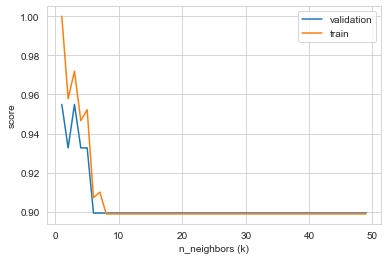

In [79]:
# K-Nearest Neighbors but with validation - 84 colums
from sklearn.model_selection import validation_curve

model = KNeighborsClassifier(n_neighbors=5)
k = np.arange(1, 50)

train_score, val_score = validation_curve(model, X_train, y_train,
                                          'n_neighbors', k, cv=5)

knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

print(confusion_matrix(y_test, y_pred))
# classification report for test set
print(metrics.classification_report(y_test, y_pred, digits=3, zero_division = 1))

# Calculate cv score with 'accuracy' scoring and 10 folds
accuracy = cross_val_score(knn, X, y, scoring = 'accuracy',cv=10)
print('cross validation score (accuracy)=',accuracy.mean())

# Calculate cv score with 'roc_auc_ovr' scoring and 10 folds
accuracy = cross_val_score(knn, X, y, scoring = 'roc_auc_ovr',cv=10)
print('cross validation score with roc_auc=',accuracy.mean())

plt.plot(k, val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors (k)')
plt.legend()

In [80]:
#K-Nearest Neighbors :GridSearchCV
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': np.arange(1, 30),
              'metric': ['euclidean', 'manhattan']}

grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid.fit(X_train, y_train)
print(grid.best_score_)
print(grid.best_params_)

model = grid.best_estimator_
model.score(X_test, y_test)

0.9549019607843137
{'metric': 'euclidean', 'n_neighbors': 1}


0.9130434782608695

In [81]:
# Random Forest: GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Train and fit the Random Forest Classification model
forest = RandomForestClassifier(n_estimators=100,random_state = 0)

# GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_features': ['auto', 'sqrt', 'log2']
}

CV_rfc = GridSearchCV(estimator=forest, param_grid=param_grid, cv= 10)
CV_rfc.fit(X_train, y_train)
print(CV_rfc.best_estimator_)
y_pred = CV_rfc.predict(X_test)

print(confusion_matrix(y_test, y_pred))
# Classification report
print(metrics.classification_report(y_test, y_pred.round(), digits=3))
# Calculate cv score with 'roc_auc_ovr' scoring and 10 folds
accuracy = cross_val_score(forest, X, y,scoring = 'roc_auc_ovr',cv=10)
print('cross validation score with roc_auc_ovr scoring=',accuracy.mean())

# Calculate roc_auc score
print('roc_auc_score=',roc_auc_score(y_test,CV_rfc.predict_proba(X_test)[:, 1]))

/Users/mvo/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning:

The least populated class in y has only 9 members, which is less than n_splits=10.



RandomForestClassifier(random_state=0)
[[20  0]
 [ 3  0]]
              precision    recall  f1-score   support

           0      0.870     1.000     0.930        20
           1      0.000     0.000     0.000         3

    accuracy                          0.870        23
   macro avg      0.435     0.500     0.465        23
weighted avg      0.756     0.870     0.809        23



/Users/mvo/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/mvo/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/mvo/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



cross validation score with roc_auc_ovr scoring= 0.945
roc_auc_score= 0.95
